# UTS

## Data Understanding

In [1]:
%pip install ucimlrepo

Note: you may need to restart the kernel to use updated packages.


In [2]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
cirrhosis_patient_survival_prediction = fetch_ucirepo(id=878) 
  
# data (as pandas dataframes) 
X = cirrhosis_patient_survival_prediction.data.features 
y = cirrhosis_patient_survival_prediction.data.targets 
  
# metadata 
print(cirrhosis_patient_survival_prediction.metadata) 
  
# variable information 
print(cirrhosis_patient_survival_prediction.variables) 

{'uci_id': 878, 'name': 'Cirrhosis Patient Survival Prediction', 'repository_url': 'https://archive.ics.uci.edu/dataset/878/cirrhosis+patient+survival+prediction+dataset-1', 'data_url': 'https://archive.ics.uci.edu/static/public/878/data.csv', 'abstract': 'Utilize 17 clinical features for predicting survival state of patients with liver cirrhosis. The survival states include 0 = D (death), 1 = C (censored), 2 = CL (censored due to liver transplantation).', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Tabular'], 'num_instances': 418, 'num_features': 17, 'feature_types': ['Real', 'Categorical'], 'demographics': ['Age', 'Sex'], 'target_col': ['Status'], 'index_col': ['ID'], 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 1989, 'last_updated': 'Fri Nov 03 2023', 'dataset_doi': '10.24432/C5R02G', 'creators': ['E. Dickson', 'P. Grambsch', 'T. Fleming', 'L. Fisher', 'A. Langworthy'], 'intro_paper': {'ID': 296, 'type'

## Eksplorasi Data

In [3]:
import pandas as pd

# Baca file CSV
df = pd.read_csv("data.csv")

# Tampilkan kolom kategorikal
categorical_columns = df.select_dtypes(include=['object', 'category']).columns
print("Kolom kategorikal:")
print(categorical_columns.tolist())
print("\n")

# Hapus kolom 'id' dari analisis statistik deskriptif jika ada
if 'id' in df.columns:
    df_numeric = df.select_dtypes(include=['number']).drop(columns=['id'])
else:
    df_numeric = df.select_dtypes(include=['number'])

# Hitung statistik deskriptif yang diminta
stats = pd.DataFrame({
    "Mean": df_numeric.mean(),
    "Median": df_numeric.median(),
    "Mode": df_numeric.mode().iloc[0],  # Mode bisa lebih dari satu nilai, ambil yang pertama
    "Std Dev": df_numeric.std(ddof=0),  # Standar deviasi populasi (ddof=0)
    "Min": df_numeric.min(),
    "Max": df_numeric.max(),
    "Missing": df_numeric.isnull().sum()
})

# Tampilkan hasil
print(stats)
print("\n")
print(df.info())

Kolom kategorikal:
['Status', 'Drug', 'Sex', 'Ascites', 'Hepatomegaly', 'Spiders', 'Edema']


                       Mean    Median      Mode      Std Dev      Min  \
ID               209.500000    209.50      1.00   120.665861     1.00   
N_Days          1917.782297   1730.00     41.00  1103.350822    41.00   
Age            18533.351675  18628.00  19724.00  3811.277913  9598.00   
Bilirubin          3.220813      1.40      0.70     4.402231     0.30   
Cholesterol      369.510563    309.50    260.00   231.535832   120.00   
Albumin            3.497440      3.53      3.35     0.424463     1.96   
Copper            97.648387     73.00     52.00    85.475721     4.00   
Alk_Phos        1982.655769   1259.00    559.00  2136.955961   289.00   
SGOT             122.556346    114.70     71.30    56.608587    26.35   
Tryglicerides    124.702128    108.00    118.00    65.033024    33.00   
Platelets        257.024570    251.00    344.00    98.204717    62.00   
Prothrombin       10.731731   

## Visualisasi Data Histogram : untuk melihat distribusi data numerik.

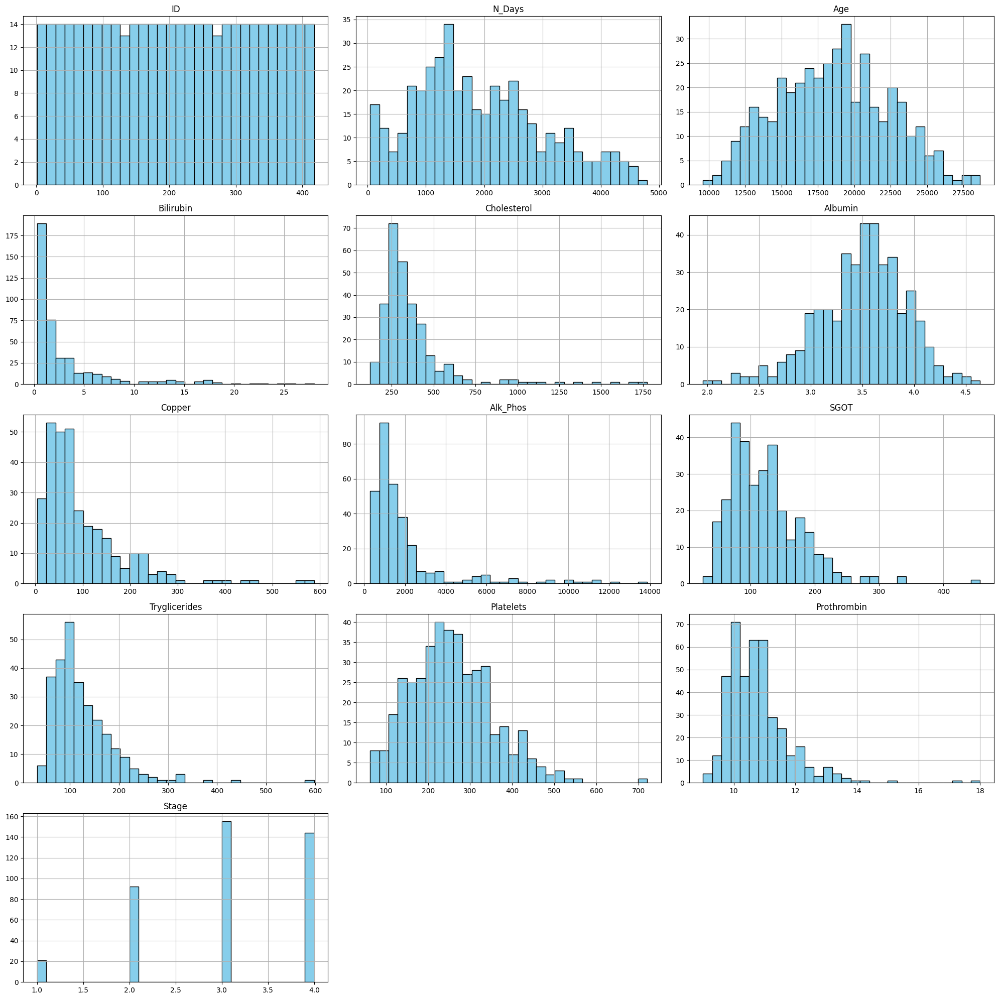

In [5]:
import matplotlib.pyplot as plt

# Memilih hanya kolom numerik
numeric_columns = df.select_dtypes(include=['number']).columns

# Membuat histogram untuk setiap kolom numerik
plt.figure(figsize=(20, 20))
for i, col in enumerate(numeric_columns, 1):
    plt.subplot(len(numeric_columns) // 3 + 1, 3, i)
    df[col].hist(bins=30, color='skyblue', edgecolor='black')
    plt.title(col)
    plt.tight_layout()

plt.show()

## Profiling data

In [6]:
%pip install ydata-profiling
%pip install ipywidgets

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [1]:
import pandas as pd
from ydata_profiling import ProfileReport

#baca dataset
df = pd.read_csv("data.csv")

#laporan profiling
profile = ProfileReport(df, explorative = True)

# Simpan laporan ke file HTML
profile.to_file("data.html")

# Tampilkan di notebook (opsional)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Menghapus Nilai NUll

In [3]:
import pandas as pd

# Baca file
df = pd.read_csv("data.csv")

# Hapus semua baris yang mengandung nilai null
df_cleaned = df.dropna()

# Simpan hasilnya ke file baru (opsional)
df_cleaned.to_csv("data_cleaned.csv", index=False)

# Info sebelum dan sesudah
print(f"Jumlah baris sebelum dibersihkan: {len(df)}")
print(f"Jumlah baris setelah dibersihkan: {len(df_cleaned)}")

Jumlah baris sebelum dibersihkan: 418
Jumlah baris setelah dibersihkan: 276


## Mendeteksi Outlier dengan KNN


=== Outlier Detection Result ===
Outlier terdeteksi (index): [12, 21, 26, 28, 34, 36, 41, 46, 47]

Jumlah Outlier: 9 dari 276 baris data (3.26%)


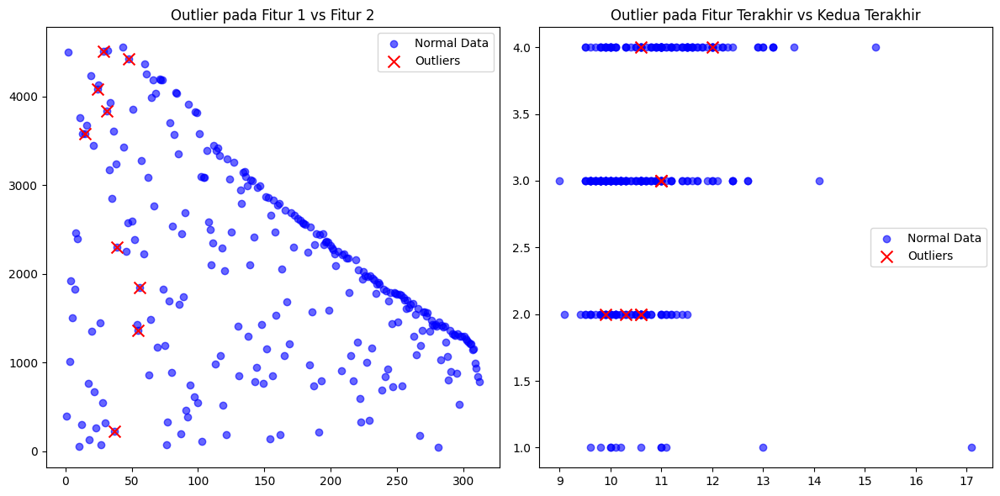

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors

# Load dataset
file_path = "data_cleaned_formatted.xlsx"
df = pd.read_excel(file_path)

# Simpan kolom ID jika ada
id_column = df['id'] if 'id' in df.columns else None

# Ambil hanya kolom numerik (dan drop 'id' dari analisis jika ada)
df_numeric = df.select_dtypes(include=['number'])
if 'id' in df_numeric.columns:
    df_numeric = df_numeric.drop(columns=['id'])

# Konversi semua kolom ke numerik (kalau masih ada string yang nyelip)
df_numeric = df_numeric.apply(pd.to_numeric, errors='coerce')

# Hapus baris yang mengandung nilai NaN
df_numeric_clean = df_numeric.dropna()

# Simpan index asli dari baris yang bersih
clean_index = df_numeric_clean.index

# Ubah menjadi array untuk KNN
X = df_numeric_clean.values

# KNN Outlier Detection
knn = NearestNeighbors(n_neighbors=3)
knn.fit(X)

# Hitung jarak ke tetangga terdekat
distances_knn, _ = knn.kneighbors(X)
mean_knn_distances = np.mean(distances_knn[:, 1:], axis=1)

# Tentukan threshold untuk outlier
threshold_knn = np.mean(mean_knn_distances) + 2.5 * np.std(mean_knn_distances)
outliers_knn = np.where(mean_knn_distances > threshold_knn)[0]

# Buat array penanda outlier untuk seluruh data
is_outlier_flags = np.full(df.shape[0], False)
is_outlier_flags[clean_index[outliers_knn]] = True

# Tambahkan ke DataFrame asli
df['is_outlier'] = is_outlier_flags

# Simpan ke Excel
df.to_excel("data_with_outliers_flag.xlsx", index=False)

# Tampilkan hasil
print("\n=== Outlier Detection Result ===")
if id_column is not None:
    outlier_ids = id_column.iloc[clean_index[outliers_knn]].values
    print(f"ID Outlier terdeteksi: {outlier_ids}")
else:
    print(f"Outlier terdeteksi (index): {clean_index[outliers_knn].tolist()}")

# Statistik tambahan
jumlah_outlier = np.sum(is_outlier_flags)
total_data = len(df)
persentase_outlier = jumlah_outlier / total_data * 100
print(f"\nJumlah Outlier: {jumlah_outlier} dari {total_data} baris data ({persentase_outlier:.2f}%)")

# Visualisasi (pakai dua fitur pertama dan terakhir jika kolom > 2)
if X.shape[1] >= 4:
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    axs[0].scatter(X[:, 0], X[:, 1], label='Normal Data', color='blue', alpha=0.6)
    axs[0].scatter(X[outliers_knn, 0], X[outliers_knn, 1], label='Outliers', color='red', marker='x', s=100)
    axs[0].set_title('Outlier pada Fitur 1 vs Fitur 2')
    axs[0].legend()

    axs[1].scatter(X[:, -2], X[:, -1], label='Normal Data', color='blue', alpha=0.6)
    axs[1].scatter(X[outliers_knn, -2], X[outliers_knn, -1], label='Outliers', color='red', marker='x', s=100)
    axs[1].set_title('Outlier pada Fitur Terakhir vs Kedua Terakhir')
    axs[1].legend()

    plt.tight_layout()
    plt.show()
else:
    print("Tidak cukup fitur numerik untuk visualisasi 2D.")

## Klasifikasi Naive Bayes  

Pada data ini model klasifikasi Naive Bayes untuk memprediksi kelangsungan hidup pasien sirosis hati atau memprediksi apakah seorang pasien akan bertahan hidup atau tidak berdasarkan sejumlah fitur medis.

## Menghapus data outlier Karena Mempengaruhi Akurasi Model

In [2]:
%pip install openpyxl

Note: you may need to restart the kernel to use updated packages.


In [6]:
import pandas as pd

# Baca file Excel
df = pd.read_excel("data_with_outliers_flag.xlsx")

# Hapus baris yang merupakan outlier
df_cleaned = df[df['is_outlier'] != True]

# Simpan ke file baru
df_cleaned.to_excel("data_cleaned_no_outliers.xlsx", index=False)

In [7]:
# Step 1: Import library
import pandas as pd
from sklearn.model_selection import LeaveOneOut
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import LabelEncoder

# Step 2: Baca dataset
file_path = 'data_cleaned_no_outliers.xlsx'
df = pd.read_excel(file_path)

# Step 3: Buang baris dengan Status 'CL' (transplantasi)
df = df[df['Status'].isin(['C', 'D'])]

# Step 4: Ubah Status: 'D' → 0 (meninggal), 'C' → 1 (hidup)
df['Status'] = df['Status'].map({'D': 0, 'C': 1})

# Step 5: Hapus kolom ID & baris kosong
df = df.drop(columns=[col for col in ['ID'] if col in df.columns])
df = df.dropna()

# Step 6: Encode kolom kategorikal
cat_cols = df.select_dtypes(include=['object']).columns
for col in cat_cols:
    df[col] = LabelEncoder().fit_transform(df[col].astype(str))

# Step 7: Pisahkan fitur dan label
X = df.drop(columns=['Status'])
y = df['Status']

# Step 8: Inisialisasi Leave-One-Out dan model
loo = LeaveOneOut()
model = GaussianNB()

# Step 9: Simpan hasil evaluasi
y_true = []
y_pred = []

# Step 10: Lakukan LOO-CV
for train_index, test_index in loo.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    model.fit(X_train, y_train)
    y_pred_single = model.predict(X_test)

    y_pred.append(y_pred_single[0])
    y_true.append(y_test)

# Step 11: Evaluasi hasil
print("Confusion Matrix:\n", confusion_matrix(y_true, y_pred))
print("\nClassification Report:\n", classification_report(y_true, y_pred, target_names=["Meninggal", "Hidup"]))
print("\nAkurasi: ", accuracy_score(y_true, y_pred))

Confusion Matrix:
 [[ 65  39]
 [ 14 131]]

Classification Report:
               precision    recall  f1-score   support

   Meninggal       0.82      0.62      0.71       104
       Hidup       0.77      0.90      0.83       145

    accuracy                           0.79       249
   macro avg       0.80      0.76      0.77       249
weighted avg       0.79      0.79      0.78       249


Akurasi:  0.7871485943775101
